# Single Image Super Resolution using ESRGAN model

**Preparing Environment**

In [1]:
pip install tensorflow_hub

Note: you may need to restart the kernel to use updated packages.


In [2]:
import os
import time
from PIL import Image
import numpy as np
import tensorflow as tf
import tensorflow_hub as hub
import matplotlib.pyplot as plt
from skimage.metrics import structural_similarity as ssim
os.environ["TFHUB_DOWNLOAD_PROGRESS"] = "True"

**Loading Model**

In [3]:
SAVED_MODEL_PATH = "https://tfhub.dev/captain-pool/esrgan-tf2/1"

**Loading images and preprocessing images to make model ready**

In [4]:
def preprocess_image(image):
  """ Preprocesses the given image to make it model ready
      Args:
        image: Image object to preprocess
  """
  hr_image = tf.cast(image, tf.float32)
  return tf.expand_dims(hr_image, 0)

def load_images_from_folder(input_path, processedimg_path):
    for filename in os.listdir(input_path):
        try:
            img = Image.open(os.path.join(input_path, filename))
            preprocessed_img = preprocess_image(img)
            save_filename = os.path.join(processedimg_path, filename)
            tf.keras.preprocessing.image.save_img(
                save_filename, preprocessed_img[0], data_format=None, file_format=None, scale=True
            )
        except:
            print("Could not load image: {}".format(filename))


input_path = "C:/Users/lifea/Downloads/SISR/model2_ESRGAN/input_images"
processedimg_path = "C:/Users/lifea/Downloads/SISR/model2_ESRGAN/preprocessed_images"
load_images_from_folder(input_path, processedimg_path)


**Applying model to preprocessed images**

In [5]:
def apply_model_to_images(input_folder, model, output_folder):
    # Create the output folder if it doesn't exist
    if not os.path.exists(output_folder):
        os.makedirs(output_folder)
    
    # Get a list of all image file names in the input folder
    image_files = [f for f in os.listdir(input_folder) if os.path.isfile(os.path.join(input_folder, f))]
    
    # Apply the model to each image and save the output
    for image_file in image_files:
        try:
            # Load the processed image
            processed_image_path = os.path.join(input_folder, image_file)
            processed_image = tf.keras.preprocessing.image.load_img(processed_image_path)
            
            # Preprocess the processed image for model input
            hr_image = tf.cast(processed_image, tf.float32)
            
            # Apply the model to the image
            fake_image = model(hr_image[tf.newaxis, ...])
            fake_image = tf.squeeze(fake_image)
            
            # Generate the save path for the output image
            save_path = os.path.join(output_folder, image_file)
            
            # Save the output image
            tf.keras.preprocessing.image.save_img(save_path, fake_image, data_format='channels_last')
        except:
            print("Could not process image: {}".format(image_file))


In [6]:
model = hub.load(SAVED_MODEL_PATH)

input_folder = "C:/Users/lifea/Downloads/SISR/model2_ESRGAN/input_images"
output_folder = "C:/Users/lifea/Downloads/SISR/model2_ESRGAN/ESRGAN_model"

apply_model_to_images(input_folder, model, output_folder)

**Comparing inputs and outputs images visually side by side**

In [7]:
def plot_images_side_by_side(input_folder, output_folder):
    # Get a list of all image file names in the input and output folders
    input_files = sorted([f for f in os.listdir(input_folder) if os.path.isfile(os.path.join(input_folder, f))])
    output_files = sorted([f for f in os.listdir(output_folder) if os.path.isfile(os.path.join(output_folder, f))])
    
    # Verify that the number of input and output files match
    if len(input_files) != len(output_files):
        print("Number of input and output files do not match.")
        return
    
    # Plot the images side by side
    num_images = len(input_files)
    fig, axes = plt.subplots(num_images, 2, figsize=(12, 6*num_images))
    
    for i in range(num_images):
        # Load the input image
        input_path = os.path.join(input_folder, input_files[i])
        input_image = plt.imread(input_path)
        
        # Load the output image
        output_path = os.path.join(output_folder, output_files[i])
        output_image = plt.imread(output_path)
        
        # Plot the input and output images side by side
        axes[i, 0].imshow(input_image)
        axes[i, 0].axis('off')
        axes[i, 0].set_title("Input Image")
        
        axes[i, 1].imshow(output_image)
        axes[i, 1].axis('off')
        axes[i, 1].set_title("Output Image")
    
    plt.tight_layout()
    plt.show()


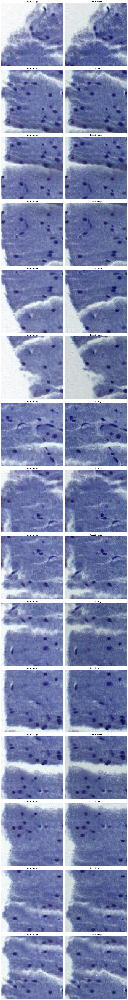

In [8]:
inputs_folder = "C:/Users/lifea/Downloads/SISR/model2_ESRGAN/input_images"
outputs_folder = "C:/Users/lifea/Downloads/SISR/model2_ESRGAN/ESRGAN_model"

plot_images_side_by_side(inputs_folder, outputs_folder)


**Evaluating the model generated results with PSNR metrics**

In [9]:
def calculate_psnr_of_images(input_dir, result_dir):
    psnr_values = []
    input_files = sorted(os.listdir(input_dir))
    result_files = sorted(os.listdir(result_dir))
    
    if len(input_files) != len(result_files):
        print("Number of input files and result files don't match.")
        return psnr_values

    num_images = len(input_files)

    for i in range(num_images):
        img1_path = os.path.join(input_dir, input_files[i])
        img2_path = os.path.join(result_dir, result_files[i])
        
        img1 = Image.open(img1_path).convert('RGB')
        img2 = Image.open(img2_path).convert('RGB')
        
        img2_resized = img2.resize(img1.size)
        mse = np.mean((np.array(img1, dtype=int) - np.array(img2_resized, dtype=int)) ** 2)
        max_pixel = 255.0
        psnr = 20 * np.log10(max_pixel / np.sqrt(mse))
        psnr_values.append(psnr)
        print(f"PSNR for image {i+1}: {psnr:.2f}")
    
    avg_psnr = np.mean(psnr_values)
    print(f"Average PSNR: {avg_psnr:.2f}")
    
    return 

In [10]:
inputs="C:/Users/lifea/Downloads/SISR/model1_SWIN2SR/swin2sr/inputs"
outputs= "C:/Users/lifea/Downloads/SISR/model2_ESRGAN/ESRGAN_model"
calculate_psnr_of_images(inputs,outputs)

PSNR for image 1: 21.99
PSNR for image 2: 23.44
PSNR for image 3: 25.02
PSNR for image 4: 25.10
PSNR for image 5: 21.63
PSNR for image 6: 18.26
PSNR for image 7: 22.33
PSNR for image 8: 22.77
PSNR for image 9: 22.69
PSNR for image 10: 18.84
PSNR for image 11: 22.25
PSNR for image 12: 21.74
PSNR for image 13: 25.16
PSNR for image 14: 21.84
PSNR for image 15: 24.75
Average PSNR: 22.52


**Evaluating the model generated with SSIM metrics**

In [11]:
def calculate_ssim_of_images(original_dir, high_res_dir):
    ssim_values = []
    original_files = sorted(os.listdir(original_dir))
    high_res_files = sorted(os.listdir(high_res_dir))

    if len(original_files) != len(high_res_files):
        print("Number of original files and high-resolution files don't match.")
        return ssim_values

    num_images = len(original_files)

    for i in range(num_images):
        original_path = os.path.join(original_dir, original_files[i])
        high_res_path = os.path.join(high_res_dir, high_res_files[i])
        
        original_image = Image.open(original_path).convert("RGB")
        original_image = original_image.resize((404, 404))
        high_res_image = Image.open(high_res_path).convert("RGB")
        
        ssim_value, _ = ssim(np.array(original_image), np.array(high_res_image), full=True, multichannel=True)
        ssim_values.append(ssim_value)
        print(f"SSIM for image {i+1}: {ssim_value:.2f}")

    average_ssim = np.mean(ssim_values)
    print(f"Average SSIM: {average_ssim:.2f}")
    
    return

In [12]:
calculate_ssim_of_images(inputs,outputs)

C:\Users\lifea\AppData\Local\Temp\ipykernel_7120\415303177.py:20: FutureWarning: `multichannel` is a deprecated argument name for `structural_similarity`. It will be removed in version 1.0. Please use `channel_axis` instead.
  ssim_value, _ = ssim(np.array(original_image), np.array(high_res_image), full=True, multichannel=True)


SSIM for image 1: 0.92
SSIM for image 2: 0.94
SSIM for image 3: 0.94
SSIM for image 4: 0.94
SSIM for image 5: 0.92
SSIM for image 6: 0.92
SSIM for image 7: 0.91
SSIM for image 8: 0.93
SSIM for image 9: 0.92
SSIM for image 10: 0.92
SSIM for image 11: 0.92
SSIM for image 12: 0.93
SSIM for image 13: 0.94
SSIM for image 14: 0.94
SSIM for image 15: 0.94
Average SSIM: 0.93


**Evaluating the model generated with LPIPS metrics**

In [13]:
pip install lpips

Note: you may need to restart the kernel to use updated packages.


In [14]:
import torch
from lpips import LPIPS
def calculate_lpips_score(folder1, folder2):
    # Load the LPIPS model
    lpips_model = LPIPS(net='alex')

    # Get the list of images in both folders
    images1 = sorted(os.listdir(folder1))
    images2 = sorted(os.listdir(folder2))

    # Check if the number of images in both folders is the same
    if len(images1) != len(images2):
        print("The number of images in both folders is not the same.")
        return

    num_images = len(images1)
    total_lpips_score = 0.0

    for i in range(num_images):
        image_path1 = os.path.join(folder1, images1[i])
        image_path2 = os.path.join(folder2, images2[i])

        # Load the images
        image1 = Image.open(image_path1).convert('RGB')
        image2 = Image.open(image_path2).convert('RGB')

        # Resize the images to have the same dimensions
        min_width = min(image1.width, image2.width)
        min_height = min(image1.height, image2.height)
        image1 = image1.resize((min_width, min_height), Image.BICUBIC)
        image2 = image2.resize((min_width, min_height), Image.BICUBIC)

        # Convert images to tensors
        image1 = torch.Tensor(np.array(image1).transpose((2, 0, 1))).float() / 255
        image2 = torch.Tensor(np.array(image2).transpose((2, 0, 1))).float() / 255

        # Calculate the LPIPS score
        lpips_score = lpips_model.forward(image1.unsqueeze(0), image2.unsqueeze(0))

        # Accumulate the LPIPS score
        total_lpips_score += lpips_score.item()

        print(f"LPIPS score for {images1[i]} and {images2[i]}: {lpips_score.item()}")

    # Calculate the average LPIPS score
    avg_lpips_score = total_lpips_score / num_images
    print("Average LPIPS score:", avg_lpips_score)

    return avg_lpips_score

In [15]:
lpips_distances = calculate_lpips_score(inputs,outputs)

Setting up [LPIPS] perceptual loss: trunk [alex], v[0.1], spatial [off]


C:\Users\lifea\anaconda3\lib\site-packages\torchvision\models\_utils.py:208: UserWarning: The parameter 'pretrained' is deprecated since 0.13 and may be removed in the future, please use 'weights' instead.
  warnings.warn(
C:\Users\lifea\anaconda3\lib\site-packages\torchvision\models\_utils.py:223: UserWarning: Arguments other than a weight enum or `None` for 'weights' are deprecated since 0.13 and may be removed in the future. The current behavior is equivalent to passing `weights=AlexNet_Weights.IMAGENET1K_V1`. You can also use `weights=AlexNet_Weights.DEFAULT` to get the most up-to-date weights.
  warnings.warn(msg)


Loading model from: C:\Users\lifea\anaconda3\lib\site-packages\lpips\weights\v0.1\alex.pth
LPIPS score for LR (1).jpeg and LR (1).jpeg: 0.0045380974188447
LPIPS score for LR (10).jpeg and LR (10).jpeg: 0.0027655139565467834
LPIPS score for LR (11).jpeg and LR (11).jpeg: 0.002686314284801483
LPIPS score for LR (12).jpeg and LR (12).jpeg: 0.003013777546584606
LPIPS score for LR (13).jpeg and LR (13).jpeg: 0.004026996903121471
LPIPS score for LR (14).jpeg and LR (14).jpeg: 0.007554453797638416


C:\Users\lifea\AppData\Local\Temp\ipykernel_7120\1694312623.py:30: DeprecationWarning: BICUBIC is deprecated and will be removed in Pillow 10 (2023-07-01). Use Resampling.BICUBIC instead.
  image1 = image1.resize((min_width, min_height), Image.BICUBIC)
C:\Users\lifea\AppData\Local\Temp\ipykernel_7120\1694312623.py:31: DeprecationWarning: BICUBIC is deprecated and will be removed in Pillow 10 (2023-07-01). Use Resampling.BICUBIC instead.
  image2 = image2.resize((min_width, min_height), Image.BICUBIC)


LPIPS score for LR (15).jpeg and LR (15).jpeg: 0.005049079656600952
LPIPS score for LR (2).jpeg and LR (2).jpeg: 0.003990651108324528
LPIPS score for LR (3).jpeg and LR (3).jpeg: 0.004185724537819624
LPIPS score for LR (4).jpeg and LR (4).jpeg: 0.008603411726653576
LPIPS score for LR (5).jpeg and LR (5).jpeg: 0.004015419166535139
LPIPS score for LR (6).jpeg and LR (6).jpeg: 0.004671609494835138
LPIPS score for LR (7).jpeg and LR (7).jpeg: 0.00263255275785923
LPIPS score for LR (8).jpeg and LR (8).jpeg: 0.004149257205426693
LPIPS score for LR (9).jpeg and LR (9).jpeg: 0.003254301380366087
Average LPIPS score: 0.0043424773961305615


**Evaluating images and comparing them visually with metrics**

In [16]:
import os
from PIL import Image
import numpy as np
import matplotlib.pyplot as plt
from skimage.metrics import structural_similarity as ssim
import torch
import torchvision.transforms as transforms
import torchvision.models as models
import torchvision.transforms.functional as TF
import lpips

def calculate_psnr(img1, img2):
    mse = np.mean((np.array(img1, dtype=int) - np.array(img2, dtype=int)) ** 2)
    max_pixel = 255.0
    psnr = 20 * np.log10(max_pixel / np.sqrt(mse))
    return psnr

def calculate_ssim(img1, img2):
    ssim_value, _ = ssim(np.array(img1), np.array(img2), full=True, multichannel=True)
    return ssim_value

def calculate_lpips(img1, img2):
    lpips_model = lpips.LPIPS(net='vgg')
    lpips_value = lpips_model(TF.to_tensor(img1).unsqueeze(0), TF.to_tensor(img2).unsqueeze(0)).item()
    return lpips_value

def load_plot_save_images(lr_folder, reconstructed_folder, hr_folder, output_folder):
    lr_files = sorted(os.listdir(lr_folder))
    reconstructed_files = sorted(os.listdir(reconstructed_folder))
    hr_files = sorted(os.listdir(hr_folder))

    if len(lr_files) != len(reconstructed_files) or len(lr_files) != len(hr_files):
        print("Number of images in input folders don't match.")
        return

    os.makedirs(output_folder, exist_ok=True)

    for i in range(len(lr_files)):
        lr_path = os.path.join(lr_folder, lr_files[i])
        reconstructed_path = os.path.join(reconstructed_folder, reconstructed_files[i])
        hr_path = os.path.join(hr_folder, hr_files[i])

        lr_image = Image.open(lr_path).convert('RGB')
        reconstructed_image = Image.open(reconstructed_path).convert('RGB')
        hr_image = Image.open(hr_path).convert('RGB')

        # Resize images to match the size of the reconstructed image
        size = reconstructed_image.size
        lr_image = lr_image.resize(size)
        hr_image = hr_image.resize(size)

        # Calculate metrics
        psnr = calculate_psnr(reconstructed_image, hr_image)
        ssim_value = calculate_ssim(reconstructed_image, hr_image)
        lpips_value = calculate_lpips(reconstructed_image, hr_image)

        # Plot images
        fig, axes = plt.subplots(1, 3, figsize=(12, 4))
        axes[0].imshow(lr_image)
        axes[0].axis('off')
        axes[0].set_title('LR Image')
        axes[1].imshow(reconstructed_image)
        axes[1].axis('off')
        axes[1].set_title('Reconstructed Image')
        axes[2].imshow(hr_image)
        axes[2].axis('off')
        axes[2].set_title('HR Image')

        # Add metric values below reconstructed image
        metric_values = f'PSNR: {psnr:.2f}, SSIM: {ssim_value:.2f}, LPIPS: {lpips_value:.2f}'
        plt.text(0.5, -0.2, metric_values, horizontalalignment='center', verticalalignment='center',
                 transform=axes[1].transAxes, fontsize=10)

        # Save the plotted image
        output_path = os.path.join(output_folder, f'image_{i+1}.png')
        plt.savefig(output_path)


C:\Users\lifea\AppData\Local\Temp\ipykernel_7120\4203176887.py:19: FutureWarning: `multichannel` is a deprecated argument name for `structural_similarity`. It will be removed in version 1.0. Please use `channel_axis` instead.
  ssim_value, _ = ssim(np.array(img1), np.array(img2), full=True, multichannel=True)
C:\Users\lifea\anaconda3\lib\site-packages\torchvision\models\_utils.py:223: UserWarning: Arguments other than a weight enum or `None` for 'weights' are deprecated since 0.13 and may be removed in the future. The current behavior is equivalent to passing `weights=VGG16_Weights.IMAGENET1K_V1`. You can also use `weights=VGG16_Weights.DEFAULT` to get the most up-to-date weights.
  warnings.warn(msg)


Setting up [LPIPS] perceptual loss: trunk [vgg], v[0.1], spatial [off]
Loading model from: C:\Users\lifea\anaconda3\lib\site-packages\lpips\weights\v0.1\vgg.pth
Setting up [LPIPS] perceptual loss: trunk [vgg], v[0.1], spatial [off]
Loading model from: C:\Users\lifea\anaconda3\lib\site-packages\lpips\weights\v0.1\vgg.pth
Setting up [LPIPS] perceptual loss: trunk [vgg], v[0.1], spatial [off]
Loading model from: C:\Users\lifea\anaconda3\lib\site-packages\lpips\weights\v0.1\vgg.pth
Setting up [LPIPS] perceptual loss: trunk [vgg], v[0.1], spatial [off]
Loading model from: C:\Users\lifea\anaconda3\lib\site-packages\lpips\weights\v0.1\vgg.pth
Setting up [LPIPS] perceptual loss: trunk [vgg], v[0.1], spatial [off]
Loading model from: C:\Users\lifea\anaconda3\lib\site-packages\lpips\weights\v0.1\vgg.pth
Setting up [LPIPS] perceptual loss: trunk [vgg], v[0.1], spatial [off]
Loading model from: C:\Users\lifea\anaconda3\lib\site-packages\lpips\weights\v0.1\vgg.pth
Setting up [LPIPS] perceptual loss

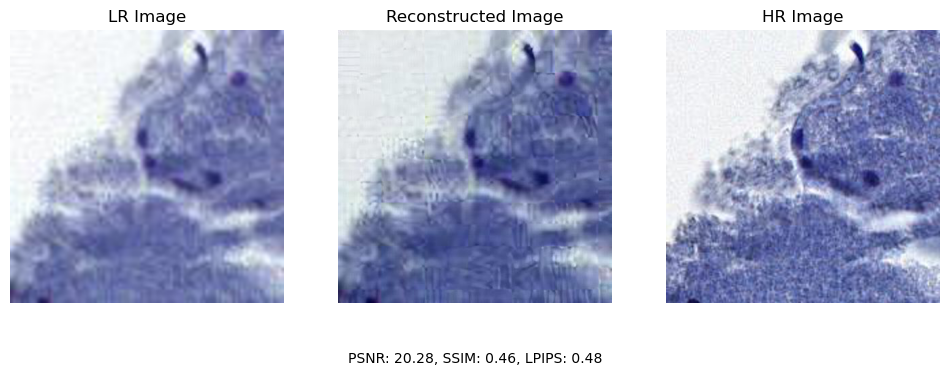

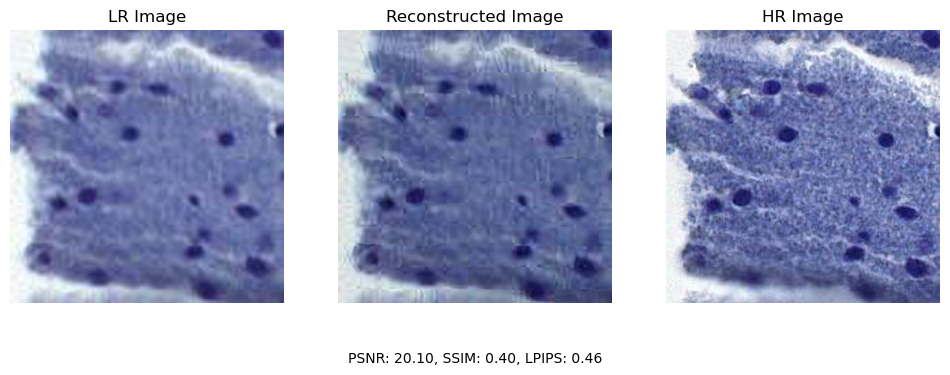

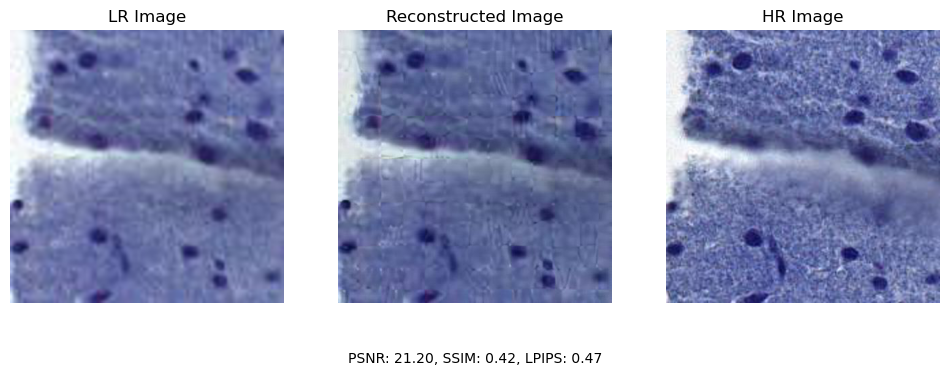

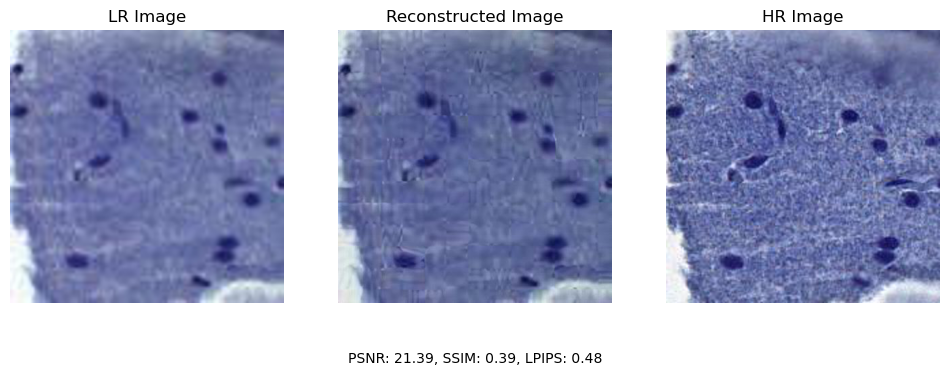

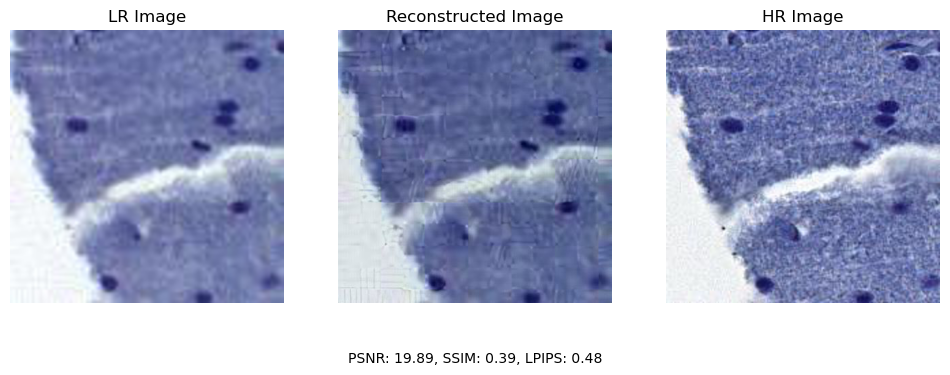

...

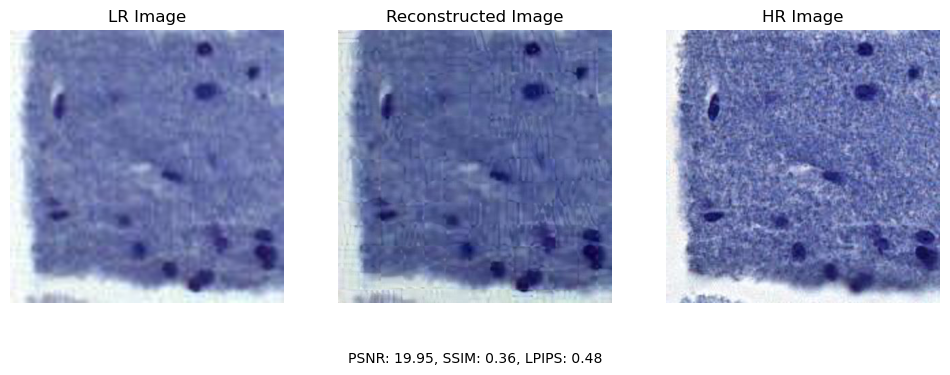

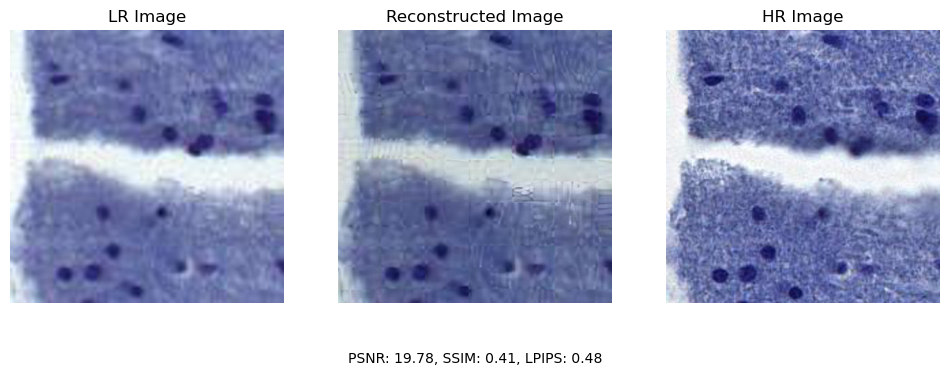

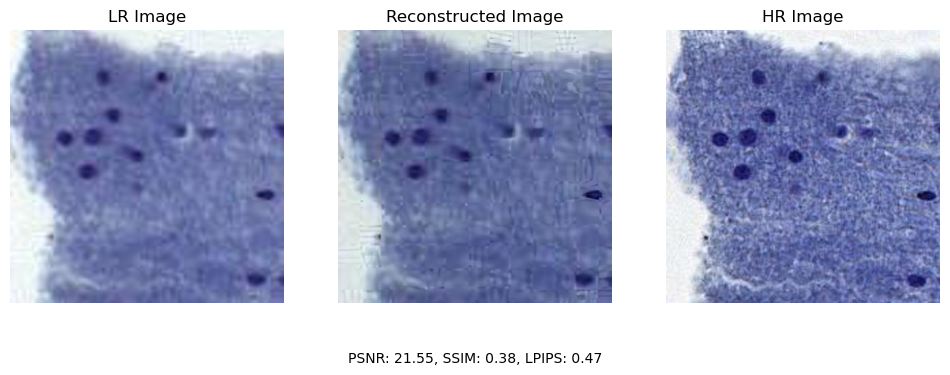

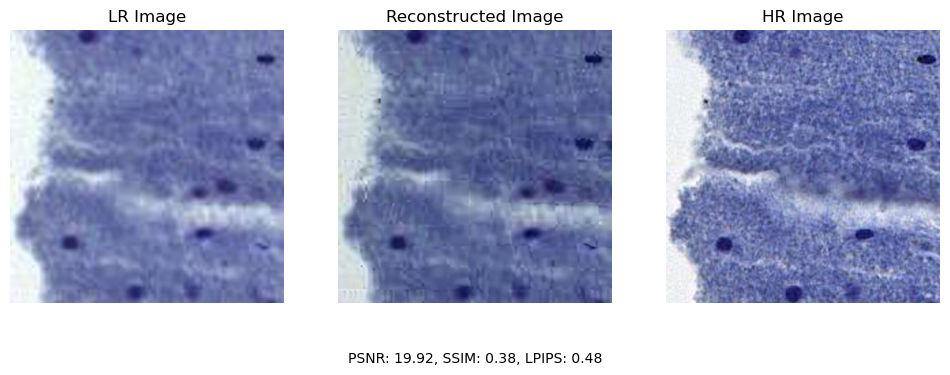

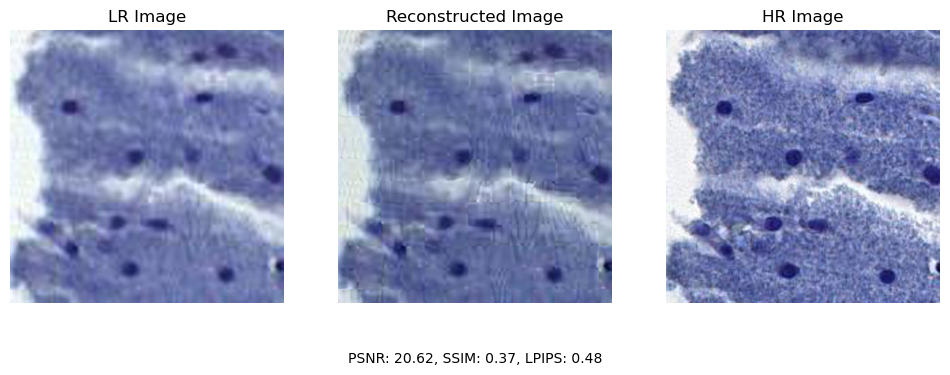

In [17]:
HR_images = 'C:/Users/lifea/Downloads/SISR/HR_images_for_evaluation'
images_compared = 'C:/Users/lifea/Downloads/SISR/model2_ESRGAN/comparing_results'

load_plot_save_images(inputs, outputs, HR_images, images_compared)